### Business Location Analysis for opening a new Fitness Center.



#### Background:

There are a number of factors to be considered when a business is first started and choosing the business location is one of the most important of them. Without a good location to attract customers whether they are end-users or re-sellers, a business will have a hard time to thrive and succeed. 
Price for the location, available basic amenities like water, power and gas and easy access to transportation facilities are few main things to be considered when opening any new business. However, some aspects of a fit-location for business varies from business to business. Depending on which type of customers that the business is approaching, the social and ethnic diversity of the city, closeness to Industrial hubs, closeness to distribution centers and free trade zones have to consider. 
Apart from above, one of the major features to be pondered is the safety of the location as it is hard to attract customers if the crime rate is high near the business. 

#### Business Problem:

In major cities like Toronto, fitness centers have a high demand and new centers are establishing every now and then to keep up with this demand. Nevertheless, Fitness centers are very popular these days as a lot of people regardless of their age trying to maintain their health by engaging in daily physical activities. Needless to say, a lot of companies encourage their employers to stay active by giving health benefits to those who reach daily fitness goals. Therefore, a new Fitness center in Toronto will be a profit-making business if it is established properly in a good location where customers have easy access.
In this project, I am taking selected factors into consideration and analyzing data that I downloaded from various sources to find a good-fit location to open a new fitness center in Toronto city.



#### Data:

Data containing Toronto neighborhoods, location coordinates (latitudes, longitudes), population and average income used in this project were downloaded from Toronto open data Portal, opendata@toronto.ca.

1.Neighbourhoods.geojson.json : Data consists of Toronto neighborhoods, neighborhood number latitude and longitude were obtained from Toronto Open Data Portal. https://open.toronto.ca/dataset/neighbourhoods/

2.neighbourhood-profiles-2016-csv.csv : Data consists of Toronto neighborhood, population and average income etc were downloaded from Toronto Open Data Portal. https://open.toronto.ca/dataset/neighbourhood-profiles/

3.Business Improvement Areas Data.geojson.json: Data consists of areas that have been improved by commercial business owners and tenants in partnership with the city to keep them thriving, competitive, and safe in order to attract shoppers, diners, tourists, and new businesses were also downloaded from Toronto Open Data Portal. https://open.toronto.ca/dataset/business-improvement-areas/

4.Foursquare API was used to get location data for 100 places within a radius of 800 from each neighborhood for clustering and segmentation of neighborhoods.


#### Feature Selection:
**Population**
The population is one of the main factors to be considered when selecting a location for a fitness center. It is always good to open a new business in or near highly populated areas. However, having an ample parking space is as crucial when selecting a location for a fitness center. In addition to that, situated in a lesser traffic location would attract customers who are tired of driving back after work. Considering all that, care should be taken to select a neighborhood with moderate population density as a higher population leads to less space and traffic.
Fitness Center also needs to be located in an easily accessible place but without so much traffic. The business traffic around the area is examined using the data extracted from Foursquare API.

**Average Income**
Also, the fitness center needs to be affordable to the people where it is located. If the fitness center membership is too expensive and does not fit peoples' needs, it will lose business soon.  If it is located in a wealthy neighborhood, it should be appealing to the site with ample space and equipped with luxurious machines even if the membership price is high. They would not worry about paying a high price to join. On the other hand, the middle class and the third class people would not be interested if the price is too high. They would rather have their own simple fitness routines than paying high membership to get trainers.

**Parking**
Having a spacious parking space is another crucial factor in the success of a fitness center if the members are driving to the facility after work or from home. Having a bus stop nearby will attract more members. In addition to that, access to parks or running routes will also add value to a fitness center as members and trainers can use them when the weather is nice.

**Competition**
It is always wise to check for the competitors in the area too. If the fitness center is to be opened near another fitness center or a similar facility like gym or yoga place, it will be hard to attract customers as the established business have already been marked their business territory in the area. 

**Nearby Businesses**
Moreover, the fitness center should be located away from fast-food restaurants, cafes, and hotels. Visibility of these types of food services has a propensity to deviate the customer’s mind from their health goals. In contrast, it is better to open a fitness center in a location close to offices(easy access to the fitness center before head home after work), chiropractors, physician (fitness is always advised by physicians) and parks(joggers will consider joining to the facility when the weather is bad). 
To identify the crowd that fits your business is very important for a business to be successful. For this project, if the fitness center targets the younger crowd, it is better to look for schools and universities nearby and a higher young population. If the fitness center targets middle-aged people, it is better to look for a location near office spaces or neighborhoods that are crowded with families rather than seniors. 



#### Methodology:


In [59]:
import pandas as pd
import numpy as np

!pip install BeautifulSoup4

import html5lib

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library


Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.



### Data wrangling

**Neighbourhoods.geojson.json is a json file containing data of Toronto neighborhoods, neighborhood number latitude and longitude.**


In [60]:
import json as js
with open('Neighbourhoods.geojson.json') as r: #open json file downloaded and saved to IBM skills network
    Neighborhoods=js.load(r) # deserialize json file in to python dictionary

Neighborhoods is a python dictionary.

{'type': 'FeatureCollection',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'_id': 1121,
    'AREA_ID': 25886861,
    'AREA_ATTR_ID': 25926662,
    'PARENT_AREA_ID': 49885,
    'AREA_SHORT_CODE': 94,
    'AREA_LONG_CODE': 94,
    'AREA_NAME': 'Wychwood (94)',
    'AREA_DESC': 'Wychwood (94)',
    'X': None,
    'Y': None,
    'LONGITUDE': -79.425514947,
    'LATITUDE': 43.6769192679,
    'OBJECTID': 16491505,
    'Shape__Area': 3217959.609375,
    'Shape__Length': 7515.779658331329},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-79.43591570873059, 43.68015339477487],
      [-79.43491506339724, 43.68036886994886],
      [-79.43394727223847, 43.680578504490335],
      [-79.43388162422195, 43.68058996121469],
      [-79.43281544978878, 43.680808044458765],
      [-79.4326971769691, 43.68079658822322],
      [-79.43253064659865, 43.68082785962871],
      [-79.43245944449654, 43.68085882710364],
      [-79.43241132723996, 43.68089794537263],
      [-79.43094766397957, 43.681205221508016],

In [61]:
Neigh_list= [] # creates an empty list
# loop through the dictionary and fill the empty list with relavent info
for Feature in Neighborhoods['features']: 
    Neigh_list.append({ 'Neighborhood name':Feature['properties']['AREA_NAME'],
                  'Neighborhood number':Feature['properties']['AREA_SHORT_CODE'],
                  'Latitude': Feature['properties']['LATITUDE'],
                  'Longitude': Feature['properties']['LONGITUDE']})
    
data1=pd.DataFrame(Neigh_list)
data1

,Neighborhood name,Neighborhood number,Latitude,Longitude
0,Wychwood (94),94,43.676919,-79.425515
1,Yonge-Eglinton (100),100,43.704689,-79.403590
2,Yonge-St.Clair (97),97,43.687859,-79.397871
3,York University Heights (27),27,43.765736,-79.488883
4,Yorkdale-Glen Park (31),31,43.714672,-79.457108
...,...,...,...,...
135,Kennedy Park (124),124,43.725556,-79.260382
136,Kensington-Chinatown (78),78,43.653554,-79.397240
137,Kingsview Village-The Westway (6),6,43.698993,-79.547863
138,Kingsway South (15),15,43.653520,-79.510577


In [62]:
# Set the index to Neighborhood number and sort the index
data1=data1.set_index('Neighborhood number').sort_index() # set and sort index
data1

,Neighborhood name,Latitude,Longitude
Neighborhood number,,,
1,West Humber-Clairville (1),43.716180,-79.596356
2,Mount Olive-Silverstone-Jamestown (2),43.746868,-79.587259
3,Thistletown-Beaumond Heights (3),43.737988,-79.563491
4,Rexdale-Kipling (4),43.723725,-79.566228
5,Elms-Old Rexdale (5),43.721519,-79.548983
...,...,...,...
136,West Hill (136),43.767490,-79.176676
137,Woburn (137),43.766740,-79.228586
138,Eglinton East (138),43.740922,-79.245598


**neighbourhood-profiles-2016-csv.csv is a CSV file containing data of Toronto neighborhoods, population and average income**

In [63]:
Demography=pd.read_csv('neighbourhood-profiles-2016-csv.csv') # read CSV file containing demographic data
Demography.head(3)

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"


In [64]:
# Extract information on Neighborhood number, population of each neighborhood and average income of each neighborhood
Demography=Demography.iloc[[0,2,2272], 6:146] # extract row 0 and 2 with relavent data from column 6 to 146
Demography

,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,129,128,20,95,42,34,76,52,49,39,...,37,7,137,64,60,94,100,97,27,31
2,"29,113","23,757","12,054","30,526","27,695","15,873","25,797","21,396","13,154","23,236",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"
2272,"30,414","31,825","47,709","112,766","67,757","45,936","56,526","52,035","47,246","123,077",...,"44,576","44,177","30,878","55,199","47,710","54,460","89,330","114,174","29,958","38,527"


In [65]:
# Transpose the matrix 
data2=Demography.T.reset_index() # Transpose and introduce index
data2

,index,0,2,2272
0,Agincourt North,129,"29,113","30,414"
1,Agincourt South-Malvern West,128,"23,757","31,825"
2,Alderwood,20,"12,054","47,709"
3,Annex,95,"30,526","112,766"
4,Banbury-Don Mills,42,"27,695","67,757"
...,...,...,...,...
135,Wychwood,94,"14,349","54,460"
136,Yonge-Eglinton,100,"11,817","89,330"
137,Yonge-St.Clair,97,"12,528","114,174"
138,York University Heights,27,"27,593","29,958"


In [66]:
# Rename the columns
data2=data2.rename({"index":"Neighborhood",0:"Neighborhood number",2:"Population",2272:"Average Income"}, axis='columns') # rename columns
data2

,Neighborhood,Neighborhood number,Population,Average Income
0,Agincourt North,129,"29,113","30,414"
1,Agincourt South-Malvern West,128,"23,757","31,825"
2,Alderwood,20,"12,054","47,709"
3,Annex,95,"30,526","112,766"
4,Banbury-Don Mills,42,"27,695","67,757"
...,...,...,...,...
135,Wychwood,94,"14,349","54,460"
136,Yonge-Eglinton,100,"11,817","89,330"
137,Yonge-St.Clair,97,"12,528","114,174"
138,York University Heights,27,"27,593","29,958"


In [67]:
data2.dtypes 

Neighborhood           object
Neighborhood number    object
Population             object
Average Income         object
dtype: object

all columns are "object" type. So these need to be change to "int64". At first, the comma in Population and Average income columns has to be removed in order to change "object" type to "int64"

In [68]:
data2['Population'] = data2['Population'].str.replace(',', '').astype('int64') # remove the comma in population data and change the 'object' data type to 'int64'
data2['Average Income'] = data2['Average Income'].str.replace(',', '').astype('int64') # remove the comma in average income data and change the 'object' data type to 'int64'
data2['Neighborhood number']=data2['Neighborhood number'].astype(str).astype('int64') # change the 'object' type to 'int64'

In [69]:
# Set the index to Neighborhood number and sort the index to consistant with data1 data frame
data2=data2.set_index('Neighborhood number').sort_index() # set and sort index

In [70]:
# Merge 2 data frames in accoradnce with neighborhood number
Toronto_data=pd.merge(data1, data2, left_index=True, right_index=True, how='outer') # merge 2 dataframes
Toronto_data.drop(["Neighborhood"],axis=1,inplace=True) # drop extra column
Toronto_data

,Neighborhood name,Latitude,Longitude,Population,Average Income
Neighborhood number,,,,,
1,West Humber-Clairville (1),43.716180,-79.596356,33312,31771
2,Mount Olive-Silverstone-Jamestown (2),43.746868,-79.587259,32954,26548
3,Thistletown-Beaumond Heights (3),43.737988,-79.563491,10360,32815
4,Rexdale-Kipling (4),43.723725,-79.566228,10529,34418
5,Elms-Old Rexdale (5),43.721519,-79.548983,9456,32012
...,...,...,...,...,...
136,West Hill (136),43.767490,-79.176676,27392,33323
137,Woburn (137),43.766740,-79.228586,53485,30878
138,Eglinton East (138),43.740922,-79.245598,22776,30033


In [71]:
Toronto_data.describe(include='all') # check the statistics of the data frame 

,Neighborhood name,Latitude,Longitude,Population,Average Income
count,140,140.000000,140.000000,140.000000,140.000000
unique,140,NaN,NaN,NaN,NaN
top,Forest Hill South (101),NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN
mean,NaN,43.708841,-79.400186,19511.221429,55248.492857
std,NaN,0.051274,0.102044,10033.589222,38738.594546
min,NaN,43.592362,-79.596356,6577.000000,25989.000000
25%,NaN,43.671009,-79.479794,12019.500000,33476.750000
50%,NaN,43.702021,-79.403989,16749.500000,44566.500000
75%,NaN,43.747294,-79.331097,23854.500000,56654.250000


No missing values in the data set. So we can proceed to analyze data.

Next, the geographical coordinates of City of Toronto was obtained using geolocator.geocode module.

In [72]:
address = 'Toronto, ON, Canada'

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))        

The geograpical coordinate of Toronto are 43.653963, -79.387207.


In [73]:
# create map of Toronto using latitude and longitude values
map_Population = folium.Map(location=[latitude, longitude], zoom_start=10)

In [74]:
map_Population.choropleth(
    
    geo_data=Neighborhoods, # the geojson which you want to draw on the map
    data=Toronto_data, # the pandas dataframe which contains the information
    columns=['Neighborhood name','Population'], # the columns from the dataframe that you want to use 
    key_on='feature.properties.AREA_NAME', # the common key between one of your columns and an attribute in the geojson. 
#This is how python knows which dataframe row matches up to which zipcode in the geojson
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population')

# add markers to map
for lat, lng, neighborhood, population in zip(Toronto_data['Latitude'], Toronto_data['Longitude'],Toronto_data['Neighborhood name'],Toronto_data['Population']):
    label = '{}, {}'.format(neighborhood, population)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Population)  

# display map
map_Population

Population is concentrated in east side and south side of Toronto.

In [75]:
map_Income = folium.Map(location=[latitude, longitude], zoom_start=10)

map_Income.choropleth(
    
    geo_data=Neighborhoods, # the geojson which you want to draw on the map
    data=Toronto_data, # the pandas dataframe which contains the information
    columns=['Neighborhood name','Average Income'], # the columns from the dataframe that you want to use 
    key_on='feature.properties.AREA_NAME', # the common key between one of your columns and an attribute in the geojson. 
#This is how python knows which dataframe row matches up to which zipcode in the geojson
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Income')

for lat, lng, neighborhood, avincome in zip(Toronto_data['Latitude'], Toronto_data['Longitude'],Toronto_data['Neighborhood name'],Toronto_data['Average Income']):
    label = '{}, {}'.format(neighborhood, avincome)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Income)  



map_Income

Wealthy people lives in the middle of the city.

Next, to get a better understanding of population and average income distribution, bar graph was plotted. Horizontal lines shows the mean value of each category.

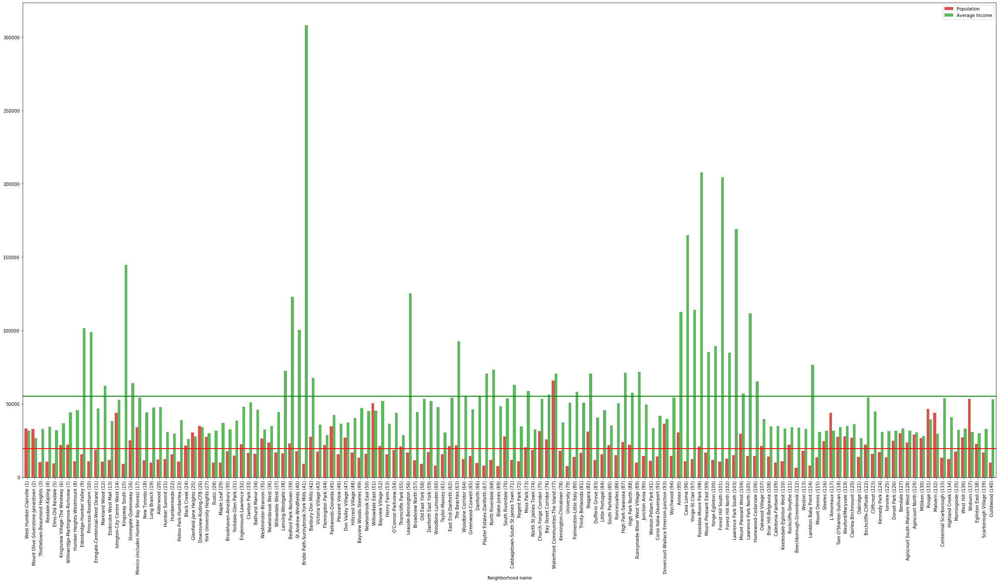

In [77]:
# visualize population and average income side by side
import matplotlib.pyplot as plt
%matplotlib inline
ax=Toronto_data[['Neighborhood name','Population','Average Income']].set_index('Neighborhood name').plot(kind='bar',
          figsize=(40,20), 
          color=['#d9534f','#5cb85c'],
          stacked=False,
          sharex=False,
          width=0.8)
ax.axhline(Toronto_data['Population'].mean(), color='red', linewidth=2, label='Population mean')  # draw a line to show the value of mean population 
ax.axhline(Toronto_data['Average Income'].mean(), color='green', linewidth=2) # draw a line to show the mean average income on the graph

We are interested in neighborhoods with moderate population in order to avoid the traffic and moderate average income to attract middle class adults. Therefore, neighborhoods within the range of 5000 from mean population was selected.
It is better to target middle class families who earns salary close to average income and up. However, targeting extra wealthy people is pointless as they would have their own gyms.
Therefore from the above filtered data, neighborhoods within the range of mean Average income -5000 to mean Average income +100,000 were selected.

In [78]:
Neigh_pop_income=Toronto_data[(Toronto_data['Population'] >15000) & (Toronto_data['Population'] <25000) ] 
Neigh_pop_income=Neigh_pop_income[(Neigh_pop_income['Average Income']> 50000) & (Neigh_pop_income['Average Income']<150000)]
Neigh_pop_income

,Neighborhood name,Latitude,Longitude,Population,Average Income
Neighborhood number,,,,,
9,Edenbridge-Humber Valley (9),43.670886,-79.522458,15535,101551
33,Clanton Park (33),43.741978,-79.446303,16472,51181
38,Lansing-Westgate (38),43.754271,-79.424748,16164,72371
39,Bedford Park-Nortown (39),43.731486,-79.420227,23236,123077
40,St.Andrew-Windfields (40),43.756246,-79.379037,17812,100516
52,Bayview Village (52),43.776361,-79.377117,21396,52035
56,Leaside-Bennington (56),43.703797,-79.366072,16828,125564
59,Danforth East York (59),43.689468,-79.331403,17180,51846
62,East End-Danforth (62),43.684174,-79.299359,21381,54324


Then, extracted neighborhood data was plotted.

Text(0, 0.5, 'Population/Average Income')

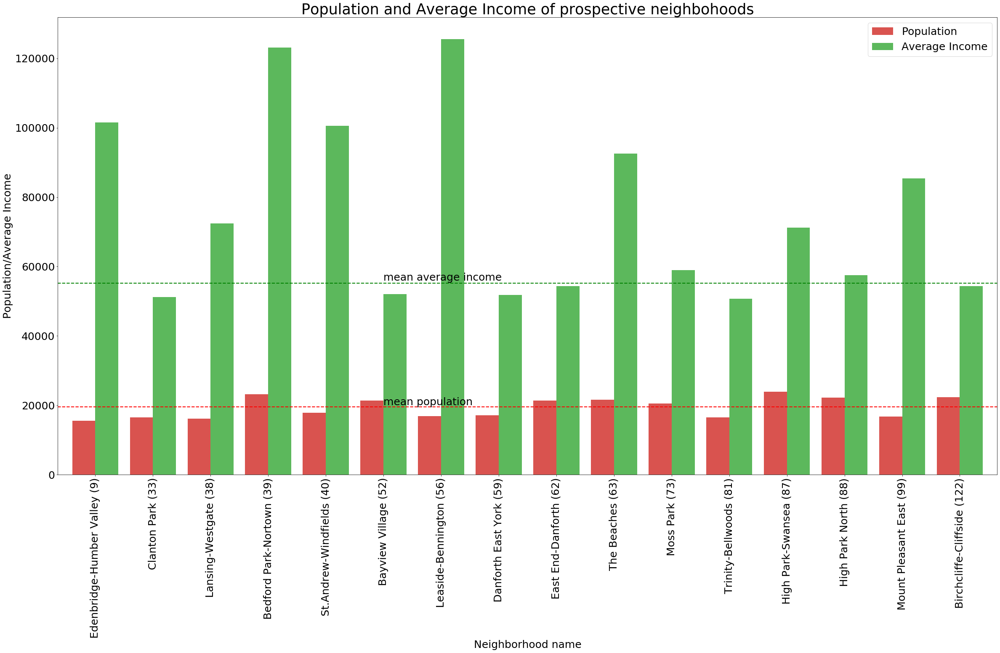

In [79]:
ax1=Neigh_pop_income[['Neighborhood name','Population','Average Income']].set_index('Neighborhood name').plot(kind='bar',
          figsize=(40,20), 
          color=['#d9534f','#5cb85c'],
          stacked=False,
          sharex=False,
          width=0.8)
ax1.axhline(Toronto_data['Population'].mean(), color='red',ls='--',linewidth=2) # draw a horizontal line at mean
ax1.axhline(Toronto_data['Average Income'].mean(), color='green',ls='--', linewidth=2) # draw a horizontal line at mean
ax1.text(5, 20000, 'mean population',fontsize=25) # add a text at given coordinates 5,2000
ax1.text(5, 56000, 'mean average income',fontsize=25)# add a text at given coordinates 5,56000
ax1.set_title('Population and Average Income of prospective neighbohoods',fontsize=35)
ax1.legend(fontsize=25)
ax1.tick_params(labelsize=25)
ax1.set_xlabel('Neighborhood name',fontsize=25)
ax1.set_ylabel('Population/Average Income',fontsize=25)

In [80]:
map_Neigh = folium.Map(location=[latitude, longitude], zoom_start=10)
# folium map to show neighborhoods in Neigh_pop_income dataframe
for lat, lng, neighborhood, avincome , pop in zip(Neigh_pop_income['Latitude'], Neigh_pop_income['Longitude'],Neigh_pop_income['Neighborhood name'],Neigh_pop_income['Average Income'],Neigh_pop_income['Population']):
    label = '{}, {},{}'.format(neighborhood, avincome,pop)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Neigh)
map_Neigh   

Business improvement areas was plotted. It is better to avoid these areas if possible.

In [81]:
with open('Business Improvement Areas Data.geojson.json') as f:
    business_areas=js.load(f)
# folium map to display business improvement areas from json file
Business_area_map=folium.Map(location=[latitude, longitude], zoom_start=10)   
folium.GeoJson( business_areas,name='geojson').add_to(Business_area_map)
Business_area_map

Foursquare API to explore the neighborhoods and segment them.

In [82]:
CLIENT_ID = 'KLXCYCV12KIEPO2PD2XLFYZY5EVEBVUY25RO5VFNW5EA05X4' # Foursquare ID
CLIENT_SECRET = 'X5Y5AKIRBCB3SWOZFTBZMSKUBQ1ZON1XLAOBXZQZI3RWYEC4' # Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [83]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

In [84]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Following is a function to get information about 100 venues within 800 meter radius around Toronto

In [85]:
def getNearbyVenues(names, latitudes, longitudes, radius=800, limit=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood name', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [86]:
Toronto_venues = getNearbyVenues(names=Toronto_data['Neighborhood name'],latitudes=Toronto_data['Latitude'],
                                   longitudes=Toronto_data['Longitude'])

In [87]:
Toronto_venues

,Neighborhood name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,West Humber-Clairville (1),43.716180,-79.596356,Fortinos,43.721438,-79.596291,Grocery Store
1,West Humber-Clairville (1),43.716180,-79.596356,Mandarin Buffet,43.719798,-79.595820,Chinese Restaurant
2,West Humber-Clairville (1),43.716180,-79.596356,Woodbine Racetrack,43.717929,-79.598574,Racecourse
3,West Humber-Clairville (1),43.716180,-79.596356,Tim Hortons,43.714657,-79.593716,Coffee Shop
4,West Humber-Clairville (1),43.716180,-79.596356,Winners,43.719819,-79.594923,Clothing Store
...,...,...,...,...,...,...,...
4327,Guildwood (140),43.748829,-79.195055,Pizza Nova,43.747086,-79.200446,Pizza Place
4328,Guildwood (140),43.748829,-79.195055,Moore's valu-mart,43.746633,-79.201031,Grocery Store
4329,Guildwood (140),43.748829,-79.195055,Guildwood Village Park,43.747538,-79.201634,Park
4330,Guildwood (140),43.748829,-79.195055,VIA Rail Guildwood,43.755070,-79.198014,Train Station


In [88]:
len(Toronto_venues["Venue Category"].unique()) # check the number of unique venues in dataframe 

324

In [89]:
#extract all the data related to businesses offering the same service as a Fitness center
Fitness_venues=Toronto_venues[Toronto_venues['Venue Category'].isin(['Gym','Gym / Fitness Center','Gym Pool','Yoga Studio','College Gym','College Rec Center',])]
Fitness_venues

,Neighborhood name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
20,West Humber-Clairville (1),43.716180,-79.596356,Zaza Shawarma,43.719994,-79.600826,Yoga Studio
151,Etobicoke West Mall (13),43.645063,-79.568939,GoodLife Fitness Etobicoke East Mall and Burnh...,43.645403,-79.559604,Gym
260,New Toronto (18),43.600589,-79.510358,Crossfit Colosseum,43.604816,-79.507024,Gym
299,Alderwood (20),43.604937,-79.541611,Toronto Gymnastics International,43.599832,-79.542924,Gym
395,Brookhaven-Amesbury (30),43.701326,-79.485589,Gyro's Gymnastics,43.703895,-79.476557,Gym / Fitness Center
...,...,...,...,...,...,...,...
4229,Malvern (132),43.803658,-79.222517,Planet Fitness,43.806744,-79.219900,Gym / Fitness Center
4231,Malvern (132),43.803658,-79.222517,Malvern Recreation Centre,43.807954,-79.217085,Gym / Fitness Center
4236,Centennial Scarborough (133),43.782376,-79.150843,Charlottetown Junior Public School,43.781736,-79.142696,Gym
4268,West Hill (136),43.767490,-79.176676,Heron Park Community Centre,43.768867,-79.176958,Gym / Fitness Center


In [91]:
Fitness_venues_count=Fitness_venues.groupby('Neighborhood name').count().reset_index() # count the number of competitors in each neighborhood
Fitness_venues_count

,Neighborhood name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Alderwood (20),1,1,1,1,1,1
1,Annex (95),2,2,2,2,2,2
2,Bay Street Corridor (76),4,4,4,4,4,4
3,Birchcliffe-Cliffside (122),1,1,1,1,1,1
4,Blake-Jones (69),1,1,1,1,1,1
5,Briar Hill-Belgravia (108),1,1,1,1,1,1
6,Bridle Path-Sunnybrook-York Mills (41),2,2,2,2,2,2
7,Brookhaven-Amesbury (30),1,1,1,1,1,1
8,Caledonia-Fairbank (109),1,1,1,1,1,1
9,Casa Loma (96),1,1,1,1,1,1


In [93]:
Fitness_venues_count=Fitness_venues_count[['Neighborhood name','Venue']] # select columns
Fitness_venues_count

,Neighborhood name,Venue
0,Alderwood (20),1
1,Annex (95),2
2,Bay Street Corridor (76),4
3,Birchcliffe-Cliffside (122),1
4,Blake-Jones (69),1
5,Briar Hill-Belgravia (108),1
6,Bridle Path-Sunnybrook-York Mills (41),2
7,Brookhaven-Amesbury (30),1
8,Caledonia-Fairbank (109),1
9,Casa Loma (96),1


In [94]:

map_Fitness=folium.Map(location=[latitude, longitude], zoom_start=10) 
# map all the competitoe=rs locations on choropleth map dispalying population density
map_Fitness.choropleth(
    
    geo_data=Neighborhoods, # the geojson which you want to draw on the map
    data=Toronto_data, # the pandas dataframe which contains the information
    columns=['Neighborhood name','Population'], # the columns from the dataframe that you want to use 
    key_on='feature.properties.AREA_NAME', # the common key between one of your columns and an attribute in the geojson. 
#This is how python knows which dataframe row matches up to which zipcode in the geojson
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population')

# add markers to map
for lat, lng, neighborhood, venue in zip(Fitness_venues['Venue Latitude'], Fitness_venues['Venue Longitude'],Fitness_venues['Neighborhood name'],Fitness_venues['Venue']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Fitness)  


map_Fitness

In [95]:
Toronto_venues.groupby('Neighborhood name').count().reset_index() # get the number of venues for each neighborhood

,Neighborhood name,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Agincourt North (129),26,26,26,26,26,26
1,Agincourt South-Malvern West (128),32,32,32,32,32,32
2,Alderwood (20),16,16,16,16,16,16
3,Annex (95),98,98,98,98,98,98
4,Banbury-Don Mills (42),40,40,40,40,40,40
...,...,...,...,...,...,...,...
135,Wychwood (94),62,62,62,62,62,62
136,Yonge-Eglinton (100),100,100,100,100,100,100
137,Yonge-St.Clair (97),64,64,64,64,64,64
138,York University Heights (27),13,13,13,13,13,13


Let's select category as the variable to perform one hot encoding.

In [97]:
Toronto_cat=pd.concat([Toronto_venues['Neighborhood name'],pd.get_dummies(Toronto_venues['Venue Category'])],axis=1) 
Toronto_cat

,Neighborhood name,ATM,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,...,Warehouse Store,Waste Facility,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,West Humber-Clairville (1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,West Humber-Clairville (1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,West Humber-Clairville (1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,West Humber-Clairville (1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,West Humber-Clairville (1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4327,Guildwood (140),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4328,Guildwood (140),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4329,Guildwood (140),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4330,Guildwood (140),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Then, let's group rows by neighborhood 

In [99]:
Toronto_grouped=Toronto_cat.groupby('Neighborhood name').mean().reset_index()
Toronto_grouped

,Neighborhood name,ATM,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,...,Warehouse Store,Waste Facility,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.038462,0.000,0.000000,0.0,0.0
1,Agincourt South-Malvern West (128),0.0,0.000000,0.0,0.0,0.031250,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.000000,0.0,0.0
2,Alderwood (20),0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.000000,0.0,0.0
3,Annex (95),0.0,0.000000,0.0,0.0,0.030612,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.000000,0.0,0.0
4,Banbury-Don Mills (42),0.0,0.000000,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.025,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),0.0,0.000000,0.0,0.0,0.016129,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.000000,0.0,0.0
136,Yonge-Eglinton (100),0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.01,0.0,0.010000,0.000,0.010000,0.0,0.0
137,Yonge-St.Clair (97),0.0,0.000000,0.0,0.0,0.015625,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.015625,0.0,0.0
138,York University Heights (27),0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.000000,0.000,0.000000,0.0,0.0


In [100]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [101]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood name'] = Toronto_grouped['Neighborhood name']

for ind in np.arange(Toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt North (129),Bakery,Ice Cream Shop,Spa,Indian Restaurant,Sporting Goods Shop,Movie Theater,Sandwich Place,Fried Chicken Joint,Taco Place,Beer Store
1,Agincourt South-Malvern West (128),Chinese Restaurant,Shopping Mall,Cantonese Restaurant,Restaurant,Bakery,Bank,Caribbean Restaurant,Seafood Restaurant,Clothing Store,Noodle House
2,Alderwood (20),Discount Store,Convenience Store,Pizza Place,Dance Studio,Shopping Mall,Sandwich Place,Skating Rink,Coffee Shop,Park,Gym
3,Annex (95),Coffee Shop,Café,Italian Restaurant,Pub,Sandwich Place,Restaurant,Pizza Place,American Restaurant,Cosmetics Shop,Bakery
4,Banbury-Don Mills (42),Cosmetics Shop,Coffee Shop,Restaurant,Café,American Restaurant,Pizza Place,Shopping Mall,Bar,Middle Eastern Restaurant,Botanical Garden


In [102]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

In [103]:
# set number of clusters
kclusters = 3

Toronto_grouped_clustering = Toronto_grouped.drop('Neighborhood name', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0::] 

array([1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 2, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1], dtype=int32)

In [104]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

#Toronto_merged = Neigh_Toronto

# merge neighborhoods_venues_sorted with Neigh_Toronto to add latitude/longitude for each neighborhood
Toronto_merged = Toronto_data.join(neighborhoods_venues_sorted.set_index('Neighborhood name'), on='Neighborhood name')

Toronto_merged.head() # check the last columns!

,Neighborhood name,Latitude,Longitude,Population,Average Income,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood number,,,,,,,,,,,,,,,,
1,West Humber-Clairville (1),43.716180,-79.596356,33312,31771,1,Coffee Shop,Hotel,Sandwich Place,Fast Food Restaurant,Racecourse,Sporting Goods Shop,Food & Drink Shop,Storage Facility,Café,Swiss Restaurant
2,Mount Olive-Silverstone-Jamestown (2),43.746868,-79.587259,32954,26548,1,Coffee Shop,Grocery Store,Pizza Place,Park,Fried Chicken Joint,Liquor Store,Discount Store,Hardware Store,Japanese Restaurant,Sandwich Place
3,Thistletown-Beaumond Heights (3),43.737988,-79.563491,10360,32815,1,Indian Restaurant,Caribbean Restaurant,ATM,Asian Restaurant,Pharmacy,Park,Coffee Shop,Skating Rink,Fast Food Restaurant,Supermarket
4,Rexdale-Kipling (4),43.723725,-79.566228,10529,34418,1,Coffee Shop,Fast Food Restaurant,Convenience Store,Sandwich Place,Pizza Place,Department Store,Clothing Store,Eastern European Restaurant,Egyptian Restaurant,Electronics Store
5,Elms-Old Rexdale (5),43.721519,-79.548983,9456,32012,1,Coffee Shop,Sandwich Place,Grocery Store,Fried Chicken Joint,Zoo Exhibit,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant


In [108]:
dd=Toronto_merged[['Cluster Labels','1st Most Common Venue']] # select columns cluster labels, 1st common venue along with index column
dd=dd.groupby(['Cluster Labels','1st Most Common Venue']).size() # group the data under cluster and type of venue and get the 
Firstcommoncounts=dd.to_frame(name='number of first common venues').reset_index() # put the data to frame and make a new column to include the counts
Firstcommoncounts


,Cluster Labels,1st Most Common Venue,number of first common venues
0,0,Chinese Restaurant,1
1,0,Convenience Store,3
2,0,Dog Run,2
3,0,Fish & Chips Shop,1
4,0,General Entertainment,1
5,0,Home Service,2
6,0,Mediterranean Restaurant,1
7,0,Park,16
8,0,Pool,2
9,1,Bakery,3


Text(0, 0.5, 'Number of 1st common venues')

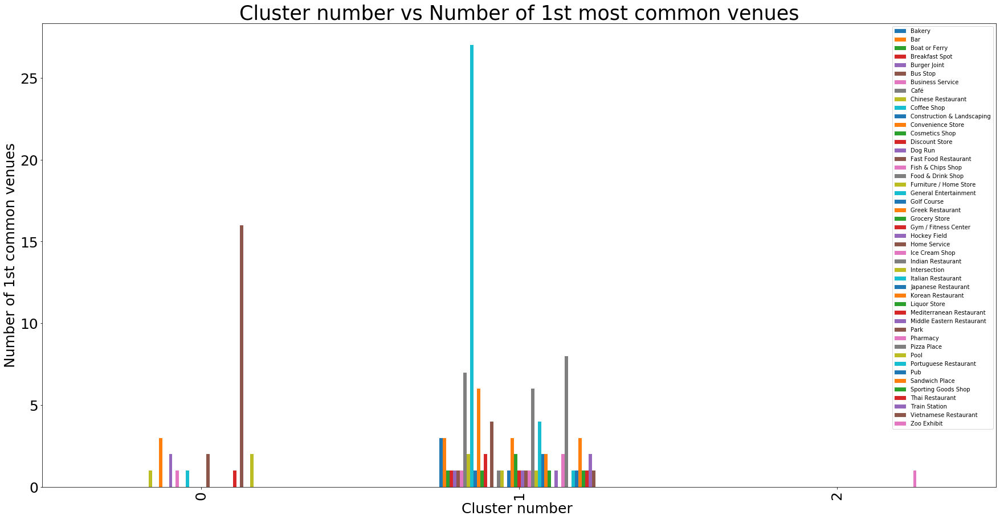

In [109]:
#plot a bar graph for above data frame Firstcommoncounts

ax2=pd.pivot_table(Firstcommoncounts, index = 'Cluster Labels', columns = '1st Most Common Venue', values = 'number of first common venues').plot(kind = 'bar',figsize=(30,15))

ax2.set_title('Cluster number vs Number of 1st most common venues',fontsize=35)
ax2.legend(fontsize=10)
ax2.tick_params(labelsize=25)
ax2.set_xlabel('Cluster number ',fontsize=25)
ax2.set_ylabel('Number of 1st common venues',fontsize=25)

In [110]:
Toronto_merged=Toronto_merged.dropna()

In [111]:
Toronto_merged['Cluster Labels']=Toronto_merged['Cluster Labels'].astype(int)

In [112]:
import matplotlib.cm as cm
import matplotlib.colors as colors

In [113]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Toronto_merged['Latitude'], Toronto_merged['Longitude'], Toronto_merged['Neighborhood name'], Toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
map_clusters   

In [117]:
# create map complementing all the findings
map_complement = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Toronto_merged['Latitude'], Toronto_merged['Longitude'], Toronto_merged['Neighborhood name'], Toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_complement)
    
for lat, lng, neighborhood, venue in zip(Fitness_venues['Venue Latitude'], Fitness_venues['Venue Longitude'],Fitness_venues['Neighborhood name'],Fitness_venues['Venue']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_complement)  
    
for lat, lng, neighborhood in zip(Neigh_pop_income['Latitude'], Neigh_pop_income['Longitude'],Neigh_pop_income['Neighborhood name']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_complement) 
    
folium.GeoJson( business_areas,name='geojson').add_to(map_complement)
folium.LayerControl().add_to(map_complement)
map_complement

In [115]:
Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 0]

,Neighborhood name,Latitude,Longitude,Population,Average Income,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood number,,,,,,,,,,,,,,,,
9,Edenbridge-Humber Valley (9),43.670886,-79.522458,15535,101551,0,Park,Bakery,Convenience Store,Bus Line,Skating Rink,Bus Stop,Garden,Egyptian Restaurant,Electronics Store,Elementary School
10,Princess-Rosethorn (10),43.666051,-79.544559,11051,99055,0,Home Service,Playground,Clothing Store,Park,Zoo Exhibit,Fair,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School
16,Stonegate-Queensway (16),43.635518,-79.501128,25051,64140,0,Park,Art Gallery,Pool,Baseball Field,Business Service,Farm,Electronics Store,Elementary School,Ethiopian Restaurant,Event Space
17,Mimico (includes Humber Bay Shores) (17),43.615924,-79.500137,33964,54438,0,Park,Café,Soccer Field,Bakery,Train Station,Grocery Store,Skating Rink,Bar,Convenience Store,American Restaurant
26,Downsview-Roding-CFB (26),43.733292,-79.490497,35052,34168,0,Home Service,Restaurant,Baseball Field,Park,Pool,Cuban Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School
33,Clanton Park (33),43.741978,-79.446303,16472,51181,0,Convenience Store,Intersection,Construction & Landscaping,Pizza Place,Park,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant
34,Bathurst Manor (34),43.764813,-79.456055,15873,45936,0,Convenience Store,Bagel Shop,Playground,Park,Baseball Field,Men's Store,Historic Site,Fair,Dumpling Restaurant,Eastern European Restaurant
35,Westminster-Branson (35),43.778813,-79.452418,26274,32724,0,Park,Butcher,Skating Rink,Pizza Place,Discount Store,Grocery Store,Coffee Shop,Zoo Exhibit,Egyptian Restaurant,Electronics Store
37,Willowdale West (37),43.771210,-79.427558,16936,44576,0,Mediterranean Restaurant,Park,Health & Beauty Service,Coffee Shop,Zoo Exhibit,Falafel Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant


In [116]:
Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 1]

,Neighborhood name,Latitude,Longitude,Population,Average Income,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood number,,,,,,,,,,,,,,,,
1,West Humber-Clairville (1),43.716180,-79.596356,33312,31771,1,Coffee Shop,Hotel,Sandwich Place,Fast Food Restaurant,Racecourse,Sporting Goods Shop,Food & Drink Shop,Storage Facility,Café,Swiss Restaurant
2,Mount Olive-Silverstone-Jamestown (2),43.746868,-79.587259,32954,26548,1,Coffee Shop,Grocery Store,Pizza Place,Park,Fried Chicken Joint,Liquor Store,Discount Store,Hardware Store,Japanese Restaurant,Sandwich Place
3,Thistletown-Beaumond Heights (3),43.737988,-79.563491,10360,32815,1,Indian Restaurant,Caribbean Restaurant,ATM,Asian Restaurant,Pharmacy,Park,Coffee Shop,Skating Rink,Fast Food Restaurant,Supermarket
4,Rexdale-Kipling (4),43.723725,-79.566228,10529,34418,1,Coffee Shop,Fast Food Restaurant,Convenience Store,Sandwich Place,Pizza Place,Department Store,Clothing Store,Eastern European Restaurant,Egyptian Restaurant,Electronics Store
5,Elms-Old Rexdale (5),43.721519,-79.548983,9456,32012,1,Coffee Shop,Sandwich Place,Grocery Store,Fried Chicken Joint,Zoo Exhibit,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Ethiopian Restaurant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,West Hill (136),43.767490,-79.176676,27392,33323,1,Food & Drink Shop,Discount Store,Liquor Store,Bus Line,Gym / Fitness Center,Park,Supermarket,Salon / Barbershop,Fast Food Restaurant,Electronics Store
137,Woburn (137),43.766740,-79.228586,53485,30878,1,Indian Restaurant,Coffee Shop,Bank,Park,Fast Food Restaurant,Discount Store,Vietnamese Restaurant,Grocery Store,Paper / Office Supplies Store,Eastern European Restaurant
138,Eglinton East (138),43.740922,-79.245598,22776,30033,1,Pharmacy,Sandwich Place,Fast Food Restaurant,Grocery Store,Bowling Alley,Liquor Store,Beer Store,Coffee Shop,Japanese Restaurant,Breakfast Spot


In [77]:
Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 2]

,Neighborhood name,Latitude,Longitude,Population,Average Income,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood number,,,,,,,,,,,,,,,,
131,Rouge (131),43.821201,-79.186343,46496,39556,2,Zoo Exhibit,Zoo,Gift Shop,Dessert Shop,Tram Station,Food & Drink Shop,Fast Food Restaurant,Other Great Outdoors,Café,Restaurant
